# Stock Market Predictions

This project predicts the __S&P index__ close price.  
The data is gathered from Yahoo Finance with the help of a python library __yahooquery__.  
We will be evaluating a couple models, and eventually constructing a deployable model.  
All of the feature engineering is contained within the feature_store.py  
The machine learning models are wrapped in a simple function to make training, and testing (see quickml.py for the wrapper class)

In [1]:
import pandas as pd
from datetime import datetime as dt

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import feature_store as fstore  # Internal module

import config as cfg  # Internal module
import quickml as qml  # Internal module


from sklearn.metrics import mean_squared_error

## Load the data
 
***A huge thanks to the developer of yahooquery***

In [2]:
# The ticker string is stored in the STOCK_TICKER variable in cfg.py
ticker = cfg.STOCK_TICKER
df = fstore.first_task()
p = fstore.FeaturesPipeline(df)
X, y, full_df = p.run()

## Features Pipeline

The code for the pipeline is in feature_store.py due to its length, and the need to reuse it elsewhere, I left it as a seperate module.
The class FeaturesPipeline has all the class methods for transforming the data and engineering the features.  
All that is needed to get the data, and run the pipeline:
```python
    df = fstore.first_task()  # Gets data via yahooquery
    p = fstore.FeaturesPipeline(df) # Creates instance of the FeaturesPipeline which does some minor transformations to the dataframe
    X, y, full_df = p.run() # engineers all the features and returns the features (X), the targets (y), and the entire dataframe (full_df)
```


In [3]:
# The original data generated by yahooquery
df.tail()

low         high        close         open  \
symbol date                                                             
^GSPC  2021-08-17  4417.830078  4462.120117  4448.080078  4462.120117   
       2021-08-18  4397.589844  4454.319824  4400.270020  4440.939941   
       2021-08-19  4367.729980  4418.609863  4405.799805  4382.439941   
       2021-08-20  4406.799805  4444.350098  4441.669922  4410.560059   
       2021-08-23  4450.290039  4484.680176  4483.069824  4450.290039   

                       volume     adjclose  
symbol date                                 
^GSPC  2021-08-17  2884000000  4448.080078  
       2021-08-18  2965210000  4400.270020  
       2021-08-19  3120840000  4405.799805  
       2021-08-20  2867770000  4441.669922  
       2021-08-23   632508489  4483.069824

In [4]:
# The full dataframe with the engineered features
full_df.tail()

,date,high,low,volume,close,weekday,avg_2_periods,avg_3_periods,avg_5_periods,std_2_periods,std_3_periods,high_low_2_periods,high_low_3_periods,high_low_5_periods,high_low_30_periods,weekday_1,weekday_2,weekday_3,weekday_4
19823,2021-08-17,4462.120117,4417.830078,2884000000,4448.080078,1,4470.469971,4467.256673,4456.186035,3.493066,6.089056,25.074951,25.319987,20.832031,31.092725,1,0,0,0
19824,2021-08-18,4454.319824,4397.589844,2965210000,4400.270020,2,4460.510010,4463.006673,4458.452051,17.578578,13.160668,43.444824,31.479980,26.654004,31.166064,0,1,0,0
19825,2021-08-19,4418.609863,4367.729980,3120840000,4405.799805,3,4424.175049,4440.430013,4450.024023,33.806817,36.934022,50.510010,47.873210,35.395996,31.987402,0,0,1,0
19826,2021-08-20,4444.350098,4406.799805,2867770000,4441.669922,4,4403.034912,4418.049967,4439.017969,3.910149,26.153399,53.804932,50.633301,40.409961,32.299740,0,0,0,1
19827,2021-08-23,4484.680176,4450.290039,632508489,4483.069824,0,4423.734863,4415.913249,4433.751953,25.364003,22.476639,44.215088,48.386719,46.409961,32.144076,0,0,0,0


In [25]:
# The inputs for the machine learning model
X.tail(2)

,avg_2_periods,avg_3_periods,avg_5_periods,std_2_periods,std_3_periods,high_low_2_periods,high_low_3_periods,high_low_5_periods,high_low_30_periods,weekday_1,weekday_2,weekday_3,weekday_4
19826,4403.034912,4418.049967,4439.017969,3.910149,26.153399,53.804932,50.633301,40.409961,32.299740,0,0,0,1
19827,4423.734863,4415.913249,4433.751953,25.364003,22.476639,44.215088,48.386719,46.409961,32.144076,0,0,0,0


### Engineered Features

The features engineered are pretty straightforward:
- Various rolling metrics for 2, 5, and 50 day increments*  
(the values are calculated starting with the previous closing price so their isn't any data leakage)
  - Mean closing prices
  - Standard deviation of closing prices
  - The average daily highs - the average daily lows
  - The binary encoding for the day of the week for the target closing price  
  
*I played around with some different values for the time periods and these seemed to be most effective.

In [6]:
# Clearing the Model class's active models just in case.
qml.Model.active = []
dummy_model = qml.Model('DummyRegressor', X, y) # The first model ran takes longer than the rest
qml.Model.active.remove(dummy_model) # Remove it from the 'active' models list

In [7]:
%%time
# ^prints the execution time of the cell
# The Model class handles the train/test split but shuffle needs to be set to False to give realistic accuracy to testing
linear_regression = qml.Model('LinearRegression', X, y, shuffle=False)
linear_regression.display_results(only_error=True)      # Only_error skips the model score and cv score since they don't tell us much about the models accuracy

--------------------------------------------------
model	|	LinearRegression()
--------------------------------------------------
RMSE	|	19.22426
--------------------------------------------------
MAE	|	11.51936
Wall time: 267 ms


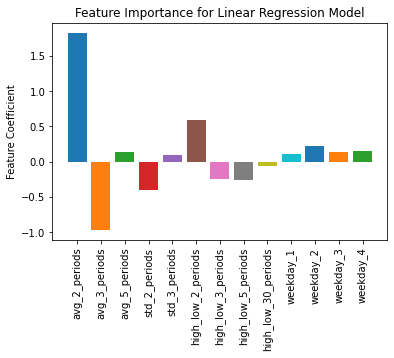

In [28]:

for i, n in zip(X.columns, linear_regression.model.coef_):
    plt.bar(i, n)
plt.title('Feature Importance for Linear Regression Model')
plt.ylabel('Feature Coefficient')

plt.xticks(rotation=90);

In [9]:
%%time
nn = qml.Model('MLPRegressor', X, y, shuffle=False, tform='StandardScaler', hidden_layer_sizes=(32, 71, 100), max_iter=300)
nn.display_results(only_error=True)

--------------------------------------------------
model	|	MLPRegressor(hidden_layer_sizes=(32, 71, 100), max_iter=300)
--------------------------------------------------
RMSE	|	21.09733
--------------------------------------------------
MAE	|	12.96602
Wall time: 32.2 s


In [10]:
%%time
lasso = qml.Model('Lasso', X, y, shuffle=False, tform='MinMaxScaler')
lasso.display_results(only_error=True)

--------------------------------------------------
model	|	Lasso()
--------------------------------------------------
RMSE	|	19.06905
--------------------------------------------------
MAE	|	11.43784
Wall time: 390 ms


In [11]:
%%time
enet = qml.Model('ElasticNet', X, y, shuffle=False, tform='MinMaxScaler')

--------------------------------------------------
model	|	ElasticNet()
--------------------------------------------------
RMSE	|	19.06644
--------------------------------------------------
MAE	|	11.42915
Wall time: 292 ms


In [ ]:
enet.display_comps(only_error=True)

In [12]:
# In case you are wondering about the "behind the scenes" of the qml.Model...
from sklearn.linear_model import ElasticNet, LinearRegression
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=13, shuffle=False)

elasticnet = ElasticNet()
elasticnet.fit(X_train, y_train)
predictions = elasticnet.predict(X_test)
rmse = mean_squared_error(y_test, predictions, squared=False)
rmse

19.066438662541035

In [13]:
full_enet = ElasticNet()
full_enet.fit(X, y)
full_predictions = full_enet.predict(X)
full_lr = LinearRegression()
full_lr.fit(X, y)
full_predictions_lr = full_lr.predict(X)
print(' Elastic Net RMSE,', ' ', 'Linear Regression RMSE')
mean_squared_error(y, full_predictions, squared=False), mean_squared_error(y, full_predictions_lr, squared=False)

In [14]:
# Creating a new df with the predicted values in a column
df_predictions = full_df.copy()
df_predictions['predicted'] = full_predictions_lr

## A Side Note

Looking at the time period of the pandemic has some interesting impacts on the model.

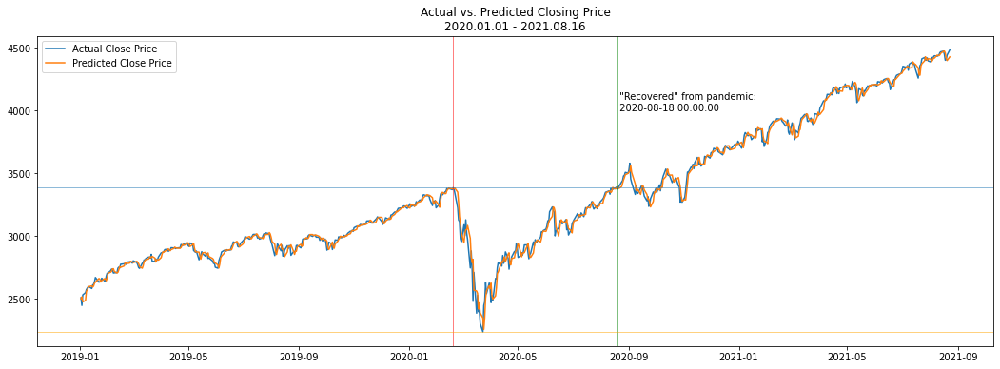

In [15]:
# Isolate key time frame metrics

df_last_year = df_predictions[df_predictions['date'] > '2019-01-01']
local = df_predictions[df_predictions['date'] < '2020-03-01'][['close', 'date']]
local_max_close = local['close'].max()
local_max_date = local[local['close'] == local_max_close]['date']
local_min_close = df_last_year['close'].min()
local_min_date = df_last_year[df_last_year['close'] == local_min_close]['date']
recovered_date = df_last_year[df_last_year['close'] > local_max_close]['date'].iloc[0]

# Plotting
plt.figure(figsize=(18,6))
plt.plot('date', 'close', data=df_last_year, label='Actual Close Price')
plt.plot('date', 'predicted', data=df_last_year, label='Predicted Close Price')
plt.title('Actual vs. Predicted Closing Price\n2020.01.01 - 2021.08.16')
plt.axvline(local_max_date, c='red', linewidth=.5)
plt.axvline(recovered_date, c='green', linewidth=.5)
plt.axhline(local_max_close, linewidth=0.5)
plt.axhline(local_min_close, linewidth=0.5, c='orange')
plt.text(recovered_date, 4000, ' "Recovered" from pandemic:\n ' + str(recovered_date))
plt.legend()
plt.show()



In [16]:
pre_pandemic = df_predictions[df_predictions['date'] < local_max_date.iloc[0]].copy()
pandemic = df_predictions[df_predictions['date'].between(local_max_date.iloc[0], recovered_date)].copy()
post_pandemic = df_predictions[df_predictions['date'] > recovered_date].copy()

# The Pandemic

There is significant impact on our model's accuracy resulting from the pandemic. The close prices deviate from it's previous linear behavior.  
Below is the breakdown of RMSEs for each time period in the full predictions for the dataset.  
The model was trained on the entire dataset not just the training set. Despite the drastic drop causing a spike in error, it does recover ground as things go back to more normal. I might try training a model that excludes that time period to see if there is a significant difference in accuracy.

In [17]:
def calculate_rmse(df):
    rmse = mean_squared_error(df['close'], df['predicted'], squared=False)
    print('\t', round(rmse, 5))
    return rmse

In [18]:
print('pre-pandemic rmse:', end='')
pre = calculate_rmse(pre_pandemic)
print('mid-pandemic rmse:', end='')
mid = calculate_rmse(pandemic)
print('post-pandemic rmse:', end='')
post = calculate_rmse(post_pandemic)
print('full dataset rmse:', end='')
full = calculate_rmse(df_predictions)

pre-pandemic rmse:	 9.65715
mid-pandemic rmse:	 71.78411
post-pandemic rmse:	 37.16446
full dataset rmse:	 11.92922


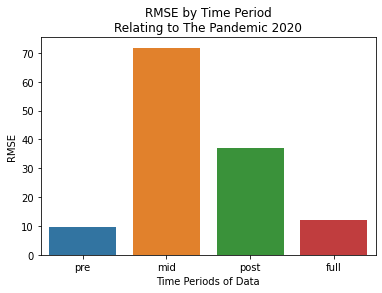

In [19]:
# A plot for the data above
sns.barplot(x=['pre', 'mid', 'post', 'full'], y=[pre, mid, post, full])
plt.title('RMSE by Time Period\nRelating to The Pandemic 2020')
plt.ylabel('RMSE')
plt.xlabel('Time Periods of Data');

In [20]:
pre_pandemic['era'] = 'pre-pandemic'
pandemic['era'] = 'mid-pandemic'
post_pandemic['era'] = 'post-pandemic'

era_df = pd.concat([pre_pandemic, pandemic, post_pandemic])
# era_df.to_csv(cfg.new_fpath('full_df_with_predictions.csv', cfg.DATA_DIR), index=False)


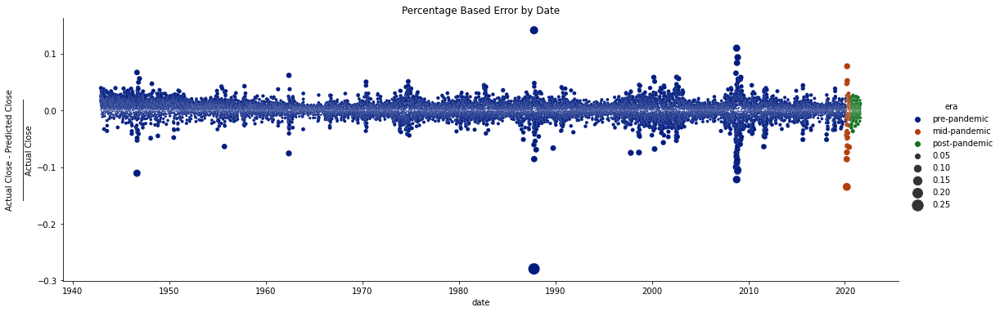

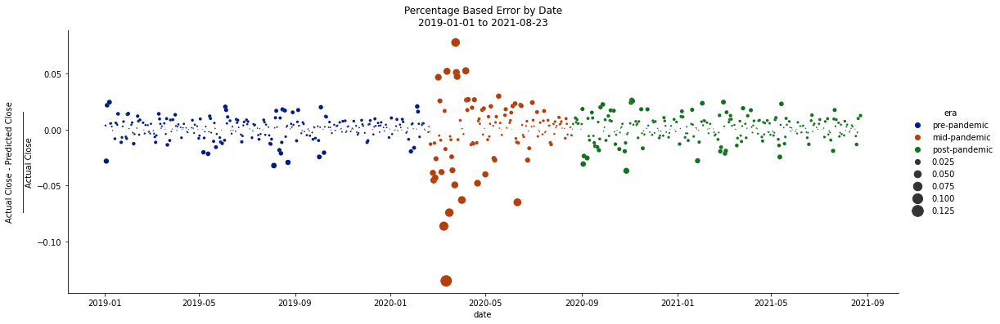

In [21]:
sns.relplot(x=era_df['date'], y=(era_df['close'] - era_df['predicted'])/era_df['close'], data=era_df,
            palette='dark', hue='era', size=abs((era_df['close'] - era_df['predicted'])/era_df['close']),
            sizes=(1,200), height=5, aspect=3)
plt.title('Percentage Based Error by Date')
plt.ylabel('Actual Close - Predicted Close\n_________________________\nActual Close')

era_df = era_df[era_df['date'] > '2019-01-01']

sns.relplot(x=era_df['date'], y=(era_df['close'] - era_df['predicted'])/era_df['close'], data=era_df,
            palette='dark', hue='era', size=abs((era_df['close'] - era_df['predicted'])/era_df['close']),
            sizes=(1,200), height=5, aspect=3)
plt.title(f'Percentage Based Error by Date\n2019-01-01 to {cfg.TODAY_DATE}')
plt.ylabel('Actual Close - Predicted Close\n_________________________\nActual Close');

# Take Aways

The performance of any ML model comes dowm to the data and the feature engineering. The concept of trash in => trash out comes to mind. A previous attempt yielded an RMSE of over 15, but through refining the parameters of the features (in addition to engineering different features) the RMSE for this model dropped to right around 12. If you look at it as a dollar amount gaining or losing $15 vs $12 is significant.  
  
# Web App with Streamlit

I used streamlit (an epic python package for quickly creating web apps) to make an app that allows you to view the next days closing price prediction, and view some other details about the model. You can even change the model (somewhat limited selection right now due to the load time of training more complex models). The Elastic Net and other Linear Regression models in the same 'family' are pretty close in terms of performance. The coolest part of it is that you can change the stock ticker (still adding more so it is quite limited at the moment). It retrains the model with the same feature engineering.

## In Conclusion...

Although not touched on, all the fancy "state of the art" models aren't always the best. For this project the neural network was the only one that was even in the same ballpark in terms of RMSE, but it's execution time was exponentially slower than the linear models.  
Having "on-demand/real-time" data to use changes how you think about a project (such as how will all of this perform in a month, a year etc).  
I ended up using the Elastic Net estimator, which performed very well "out of the box"--no need to optimize parameters.
